In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA
import warnings
warnings.filterwarnings('ignore')





In [2]:
import pandas as pd

# Loading data with the correct date column name
df = pd.read_csv(r"historic_demand_2009_2024_noNaN.csv", encoding='latin1', parse_dates=['settlement_date'])

# Filter data from 2018 onwards
df = df[df['settlement_date'] >= '2018-01-01']


In [9]:
#Checking null values in the dataset 
df.isnull().sum()

settlement_date              0
settlement_period            0
period_hour                  0
nd                           0
tsd                          0
england_wales_demand         0
embedded_wind_generation     0
embedded_wind_capacity       0
embedded_solar_generation    0
embedded_solar_capacity      0
non_bm_stor                  0
pump_storage_pumping         0
ifa_flow                     0
ifa2_flow                    0
britned_flow                 0
moyle_flow                   0
east_west_flow               0
nemo_flow                    0
is_holiday                   0
dtype: int64

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 115762 entries, 157038 to 272799
Data columns (total 19 columns):
 #   Column                     Non-Null Count   Dtype         
---  ------                     --------------   -----         
 0   settlement_date            115762 non-null  datetime64[ns]
 1   settlement_period          115762 non-null  int64         
 2   period_hour                115762 non-null  object        
 3   nd                         115762 non-null  int64         
 4   tsd                        115762 non-null  int64         
 5   england_wales_demand       115762 non-null  int64         
 6   embedded_wind_generation   115762 non-null  int64         
 7   embedded_wind_capacity     115762 non-null  int64         
 8   embedded_solar_generation  115762 non-null  int64         
 9   embedded_solar_capacity    115762 non-null  int64         
 10  non_bm_stor                115762 non-null  int64         
 11  pump_storage_pumping       115762 non-null  int64   

In [10]:
print(df.columns)



Index(['settlement_date', 'settlement_period', 'period_hour', 'nd', 'tsd',
       'england_wales_demand', 'embedded_wind_generation',
       'embedded_wind_capacity', 'embedded_solar_generation',
       'embedded_solar_capacity', 'non_bm_stor', 'pump_storage_pumping',
       'ifa_flow', 'ifa2_flow', 'britned_flow', 'moyle_flow', 'east_west_flow',
       'nemo_flow', 'is_holiday'],
      dtype='object')


In [11]:
df.describe()

,settlement_date,settlement_period,nd,tsd,england_wales_demand,embedded_wind_generation,embedded_wind_capacity,embedded_solar_generation,embedded_solar_capacity,non_bm_stor,pump_storage_pumping,ifa_flow,ifa2_flow,britned_flow,moyle_flow,east_west_flow,nemo_flow,is_holiday
count,115762,115762.000000,115762.000000,115762.000000,115762.000000,115762.000000,115762.000000,115762.000000,115762.000000,115762.000000,115762.000000,115762.000000,115762.000000,115762.000000,115762.000000,115762.000000,115762.000000,115762.000000
mean,2021-04-20 23:49:00.545256192,24.497218,27776.843446,29434.387718,25397.473826,1734.352439,6381.107747,1395.326143,13851.365854,4.054759,219.956963,889.602780,119.090962,447.413564,-106.388746,-27.972668,401.745029,0.023220
min,2018-01-01 00:00:00,1.000000,13367.000000,16513.000000,0.000000,147.000000,5754.000000,0.000000,12916.000000,0.000000,0.000000,-2056.000000,-1030.000000,-1076.000000,-505.000000,-585.000000,-1022.000000,0.000000
25%,2019-08-27 00:07:30,12.000000,22708.000000,24677.000000,20751.000000,879.000000,6192.000000,0.000000,13080.000000,0.000000,7.000000,25.000000,-1.000000,0.000000,-393.000000,-243.000000,0.000000,0.000000
50%,2021-04-21 00:15:00,24.000000,26986.500000,28617.000000,24625.000000,1496.000000,6527.000000,12.000000,13080.000000,0.000000,11.000000,1164.000000,0.000000,690.000000,-99.000000,0.000000,588.000000,0.000000
75%,2022-12-14 23:22:30,36.000000,31952.750000,33240.750000,29211.000000,2387.000000,6545.000000,2280.000000,13861.000000,0.000000,142.000000,1806.000000,454.000000,993.000000,117.000000,142.000000,917.000000,0.000000
max,2024-08-08 23:30:00,48.000000,49807.000000,50608.000000,46356.000000,5587.000000,6574.000000,10747.000000,16445.000000,684.000000,1963.000000,2065.000000,1016.000000,1088.000000,499.000000,504.000000,1033.000000,1.000000
std,NaN,13.851986,6511.731260,6203.714622,5952.922247,1064.218521,248.176969,2143.229577,1173.463469,34.360197,417.205881,1040.410317,533.736377,599.367858,275.820830,313.435594,559.502978,0.150602


In [12]:
from sklearn.preprocessing import StandardScaler

# Listing of numerical columns to standardize
numerical_columns = ['nd', 'tsd', 'england_wales_demand', 'embedded_wind_generation',
                     'embedded_wind_capacity', 'embedded_solar_generation', 'embedded_solar_capacity',
                     'non_bm_stor', 'pump_storage_pumping', 'ifa_flow', 'ifa2_flow', 
                     'britned_flow', 'moyle_flow', 'east_west_flow', 'nemo_flow']

# Initializing the scaler
scaler = StandardScaler()

# Standardizing the numerical columns
df[numerical_columns] = scaler.fit_transform(df[numerical_columns])

# Check the standardized dataframe
print(df.head())


           settlement_date  settlement_period period_hour        nd       tsd  \
157038 2018-01-01 00:00:00                  1     0:00:00 -0.335372 -0.472846   
157039 2018-01-01 00:30:00                  2     0:30:00 -0.219273 -0.359043   
157040 2018-01-01 01:00:00                  3     1:00:00 -0.236013 -0.315036   
157041 2018-01-01 01:30:00                  4     1:30:00 -0.381597 -0.431096   
157042 2018-01-01 02:00:00                  5     2:00:00 -0.516124 -0.527491   

        england_wales_demand  embedded_wind_generation  \
157038             -0.351169                  1.249418   
157039             -0.233075                  1.193978   
157040             -0.263985                  1.142296   
157041             -0.412148                  1.090615   
157042             -0.546032                  1.087796   

        embedded_wind_capacity  embedded_solar_generation  \
157038               -2.526868                  -0.651042   
157039               -2.526868            

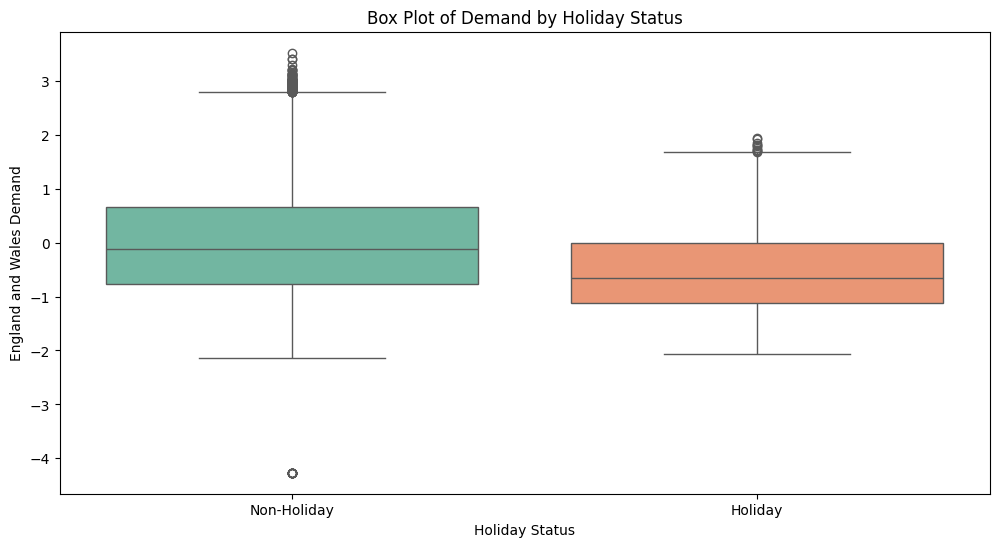

In [40]:
plt.figure(figsize=(12, 6))

sns.boxplot(data=df, x='is_holiday', y='england_wales_demand', palette='Set2')
plt.title('Box Plot of Demand by Holiday Status')
plt.xlabel('Holiday Status')
plt.ylabel('England and Wales Demand')
plt.xticks([0, 1], ['Non-Holiday', 'Holiday'])
plt.show()

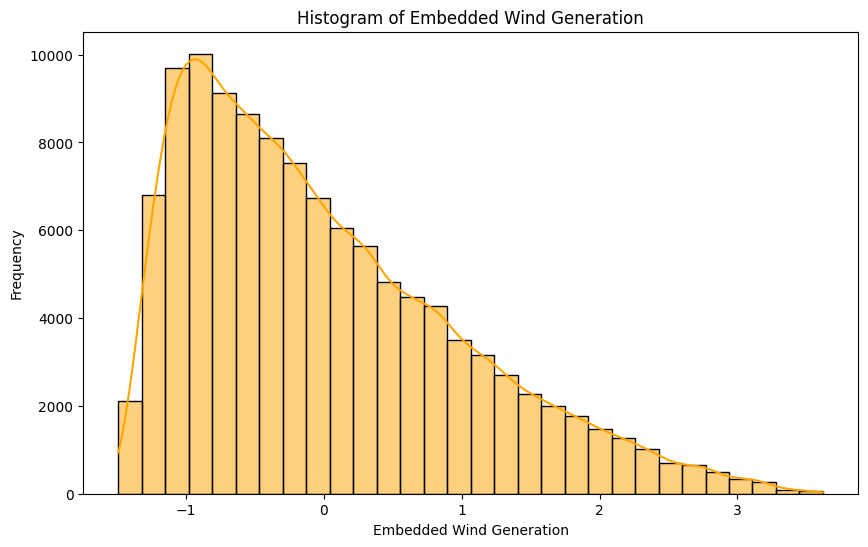

In [14]:
plt.figure(figsize=(10, 6))
sns.histplot(df['embedded_wind_generation'], bins=30, kde=True, color='orange')
plt.title('Histogram of Embedded Wind Generation')
plt.xlabel('Embedded Wind Generation')
plt.ylabel('Frequency')
plt.show()


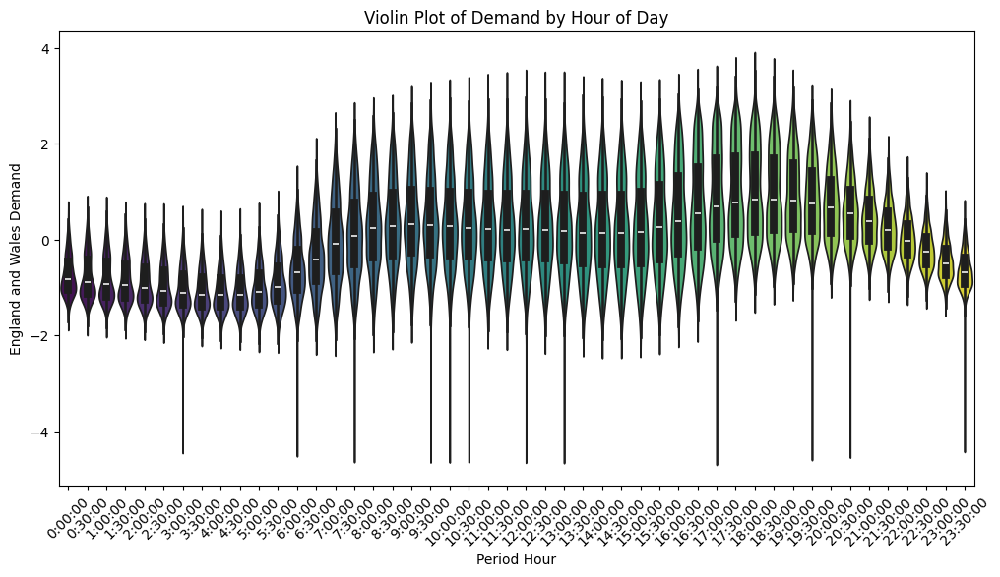

In [15]:
plt.figure(figsize=(12, 6))
sns.violinplot(data=df, x='period_hour', y='england_wales_demand', palette='viridis')
plt.title('Violin Plot of Demand by Hour of Day')
plt.xlabel('Period Hour')
plt.ylabel('England and Wales Demand')
plt.xticks(rotation=45)
plt.show()

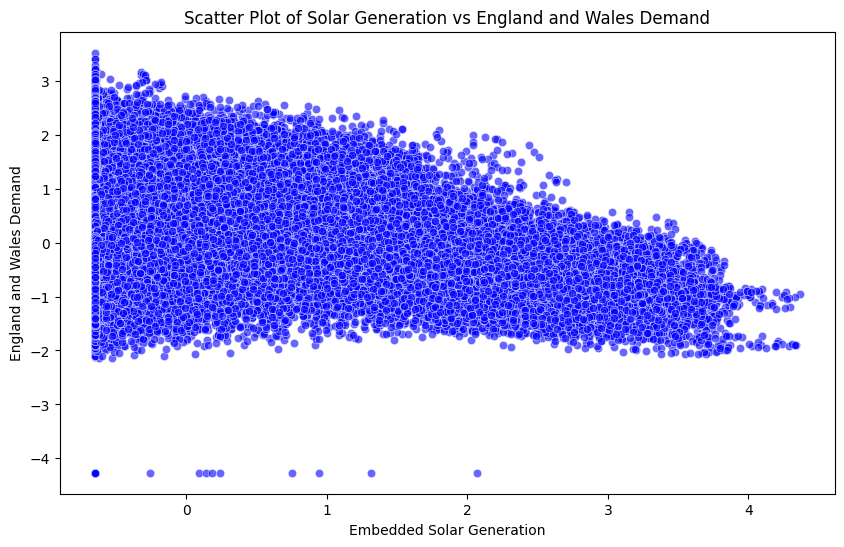

In [16]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='embedded_solar_generation', y='england_wales_demand', color='blue', alpha=0.6)
plt.title('Scatter Plot of Solar Generation vs England and Wales Demand')
plt.xlabel('Embedded Solar Generation')
plt.ylabel('England and Wales Demand')
plt.show()

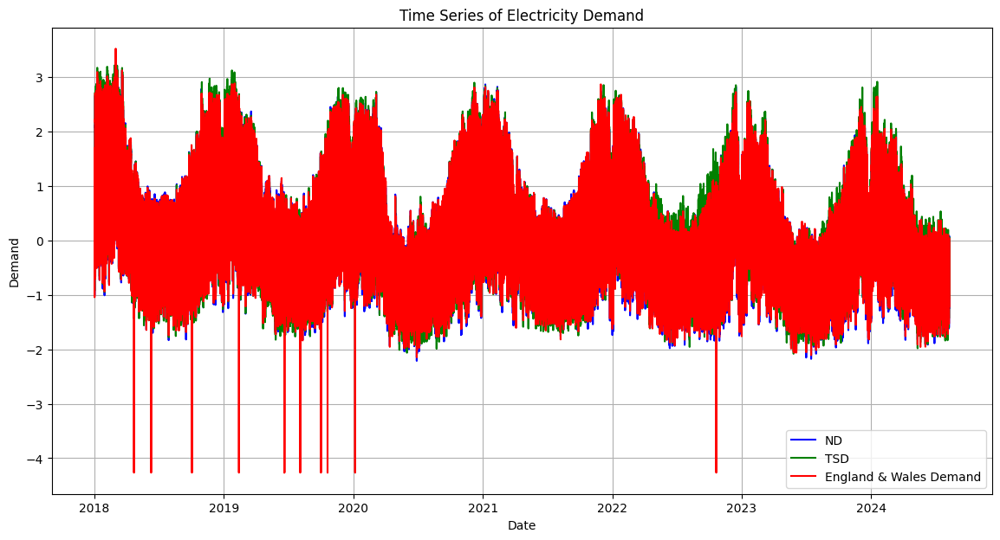

In [17]:
import matplotlib.pyplot as plt

# Ensure 'settlement_date' is a datetime object and sort by date
df['settlement_date'] = pd.to_datetime(df['settlement_date'])
df = df.sort_values('settlement_date')

# Plot time series for 'nd', 'tsd', 'england_wales_demand'
plt.figure(figsize=(14, 7))
plt.plot(df['settlement_date'], df['nd'], label='ND', color='blue')
plt.plot(df['settlement_date'], df['tsd'], label='TSD', color='green')
plt.plot(df['settlement_date'], df['england_wales_demand'], label='England & Wales Demand', color='red')
plt.xlabel('Date')
plt.ylabel('Demand')
plt.title('Time Series of Electricity Demand')
plt.legend()
plt.grid(True)
plt.show()


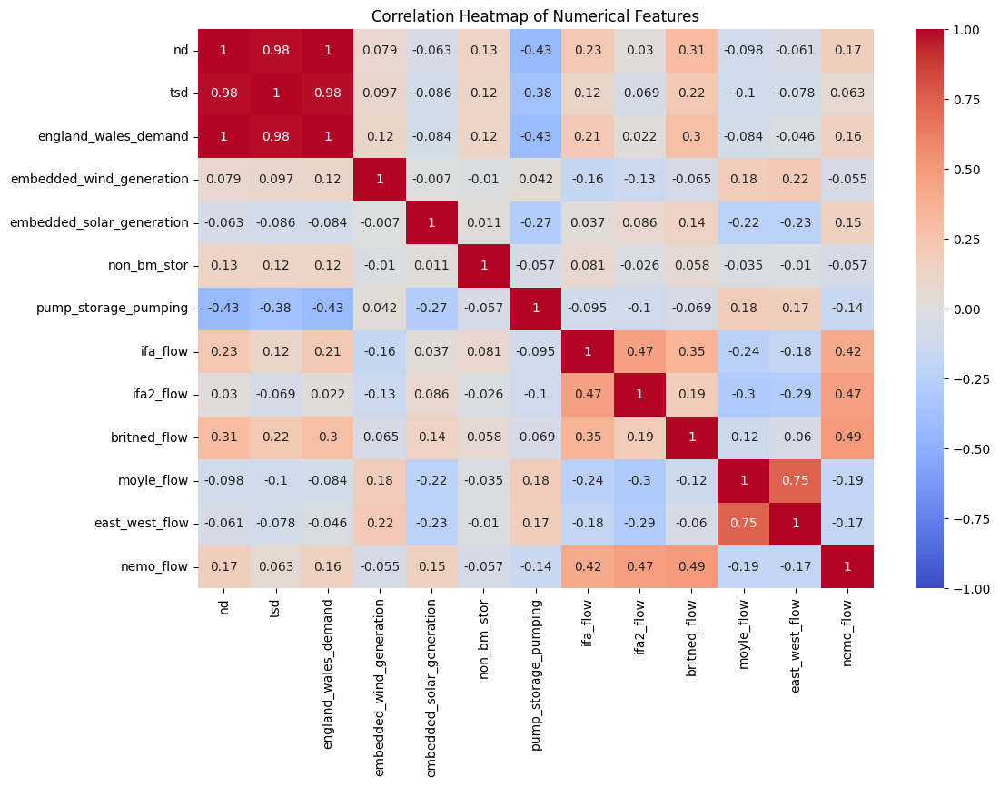

In [18]:
import seaborn as sns

# Select numerical features
numerical_features = ['nd', 'tsd', 'england_wales_demand', 'embedded_wind_generation', 'embedded_solar_generation',
                      'non_bm_stor', 'pump_storage_pumping', 'ifa_flow', 'ifa2_flow', 'britned_flow', 
                      'moyle_flow', 'east_west_flow', 'nemo_flow']

# Compute correlations
correlation_matrix = df[numerical_features].corr()

# Plot heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, center=0)
plt.title('Correlation Heatmap of Numerical Features')
plt.show()


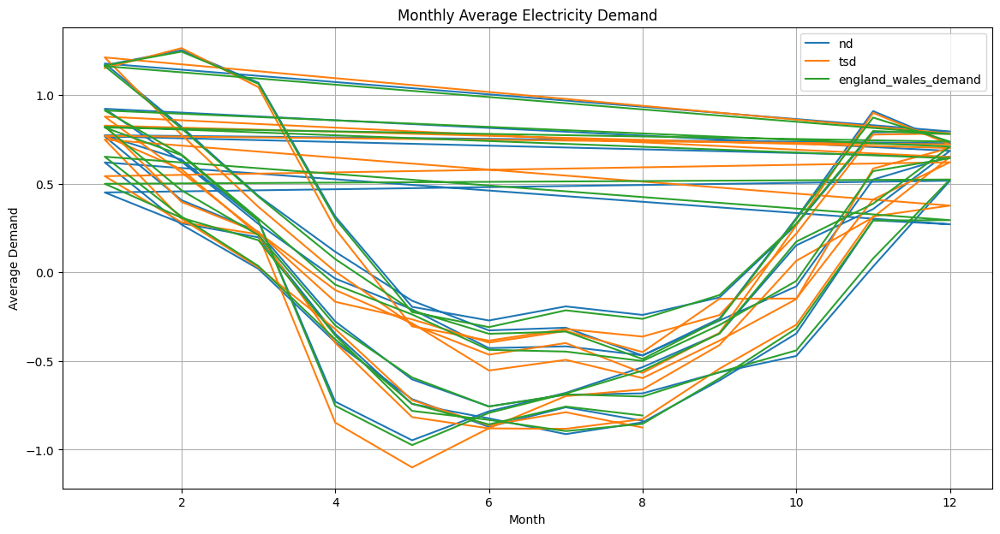

In [19]:
# Add month and year columns if not already present
df['month'] = df['settlement_date'].dt.month
df['year'] = df['settlement_date'].dt.year

# Aggregate data by month and year
monthly_demand = df.groupby(['year', 'month'])[['nd', 'tsd', 'england_wales_demand']].mean().reset_index()

plt.figure(figsize=(14, 7))
for column in ['nd', 'tsd', 'england_wales_demand']:
    plt.plot(monthly_demand[['month']], monthly_demand[column], label=column)

plt.xlabel('Month')
plt.ylabel('Average Demand')
plt.title('Monthly Average Electricity Demand')
plt.legend()
plt.grid(True)
plt.show()


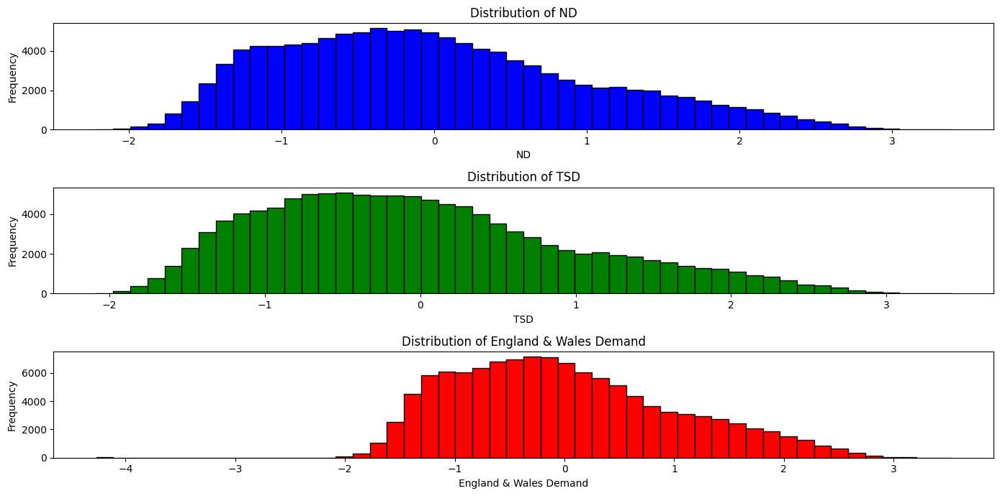

In [20]:
plt.figure(figsize=(14, 7))

# Histogram for ND
plt.subplot(3, 1, 1)
plt.hist(df['nd'], bins=50, color='blue', edgecolor='black')
plt.title('Distribution of ND')
plt.xlabel('ND')
plt.ylabel('Frequency')

# Histogram for TSD
plt.subplot(3, 1, 2)
plt.hist(df['tsd'], bins=50, color='green', edgecolor='black')
plt.title('Distribution of TSD')
plt.xlabel('TSD')
plt.ylabel('Frequency')

# Histogram for England & Wales Demand
plt.subplot(3, 1, 3)
plt.hist(df['england_wales_demand'], bins=50, color='red', edgecolor='black')
plt.title('Distribution of England & Wales Demand')
plt.xlabel('England & Wales Demand')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


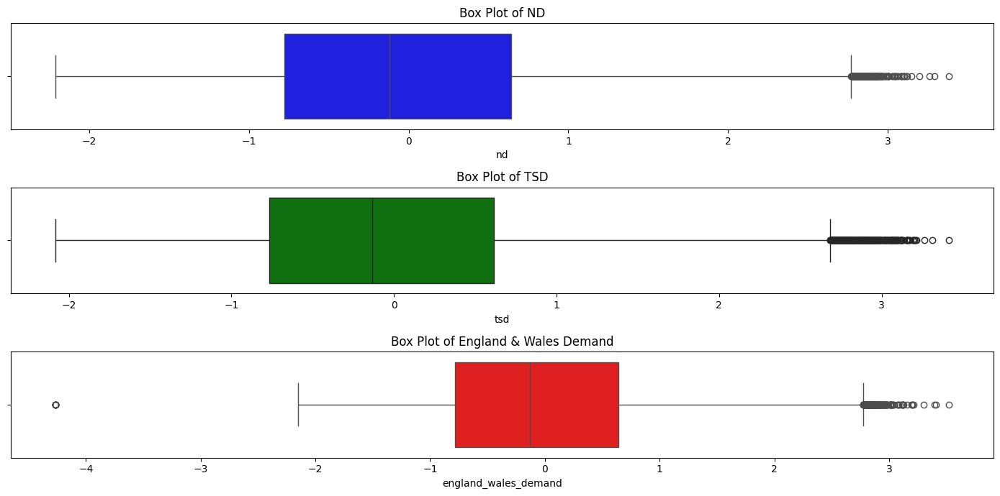

In [21]:
plt.figure(figsize=(14, 7))

# Box plot for ND
plt.subplot(3, 1, 1)
sns.boxplot(x='nd', data=df, color='blue')
plt.title('Box Plot of ND')

# Box plot for TSD
plt.subplot(3, 1, 2)
sns.boxplot(x='tsd', data=df, color='green')
plt.title('Box Plot of TSD')

# Box plot for England & Wales Demand
plt.subplot(3, 1, 3)
sns.boxplot(x='england_wales_demand', data=df, color='red')
plt.title('Box Plot of England & Wales Demand')

plt.tight_layout()
plt.show()


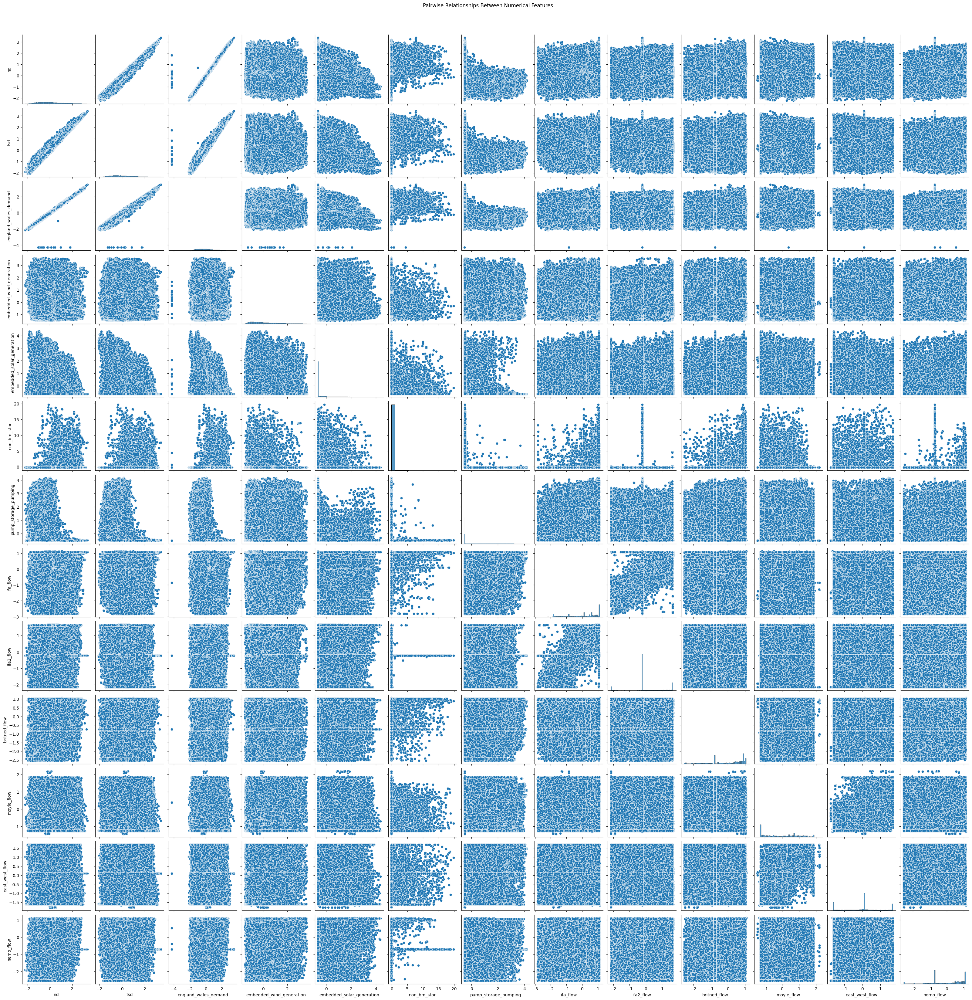

In [22]:
sns.pairplot(df[numerical_features])
plt.suptitle('Pairwise Relationships Between Numerical Features', y=1.02)
plt.show()


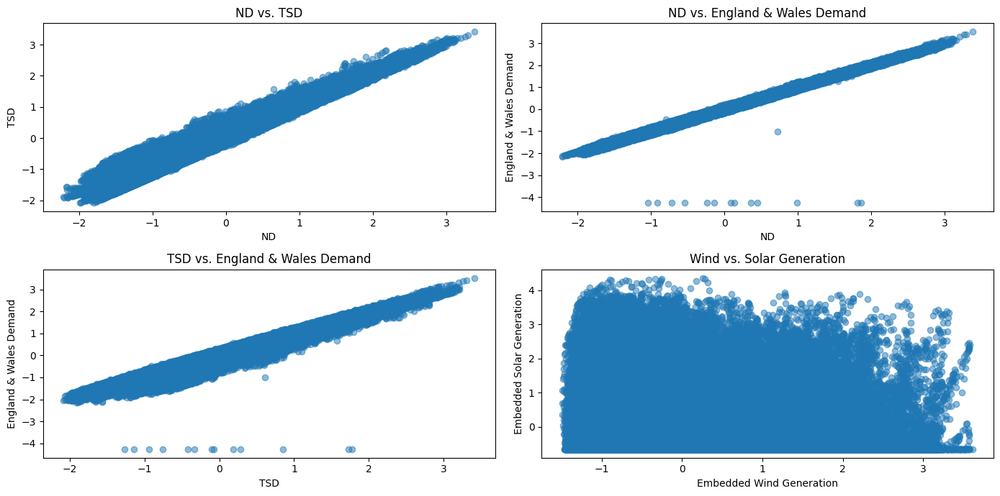

In [23]:
plt.figure(figsize=(14, 7))

# Scatter plot for ND vs. TSD
plt.subplot(2, 2, 1)
plt.scatter(df['nd'], df['tsd'], alpha=0.5)
plt.xlabel('ND')
plt.ylabel('TSD')
plt.title('ND vs. TSD')

# Scatter plot for ND vs. England & Wales Demand
plt.subplot(2, 2, 2)
plt.scatter(df['nd'], df['england_wales_demand'], alpha=0.5)
plt.xlabel('ND')
plt.ylabel('England & Wales Demand')
plt.title('ND vs. England & Wales Demand')

# Scatter plot for TSD vs. England & Wales Demand
plt.subplot(2, 2, 3)
plt.scatter(df['tsd'], df['england_wales_demand'], alpha=0.5)
plt.xlabel('TSD')
plt.ylabel('England & Wales Demand')
plt.title('TSD vs. England & Wales Demand')

# Scatter plot for Embedded Wind Generation vs. Embedded Solar Generation
plt.subplot(2, 2, 4)
plt.scatter(df['embedded_wind_generation'], df['embedded_solar_generation'], alpha=0.5)
plt.xlabel('Embedded Wind Generation')
plt.ylabel('Embedded Solar Generation')
plt.title('Wind vs. Solar Generation')

plt.tight_layout()
plt.show()


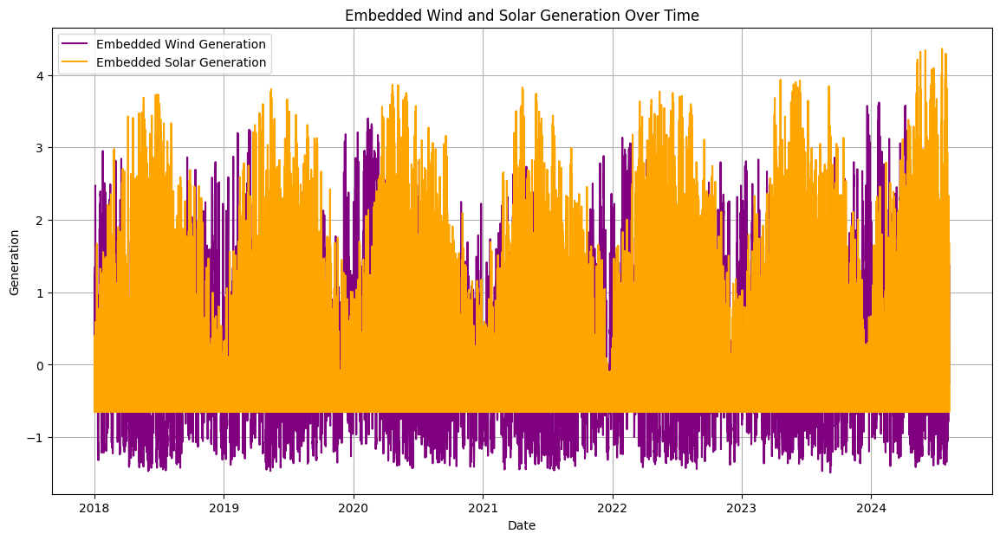

In [24]:
plt.figure(figsize=(14, 7))

plt.plot(df['settlement_date'], df['embedded_wind_generation'], label='Embedded Wind Generation', color='purple')
plt.plot(df['settlement_date'], df['embedded_solar_generation'], label='Embedded Solar Generation', color='orange')

plt.xlabel('Date')
plt.ylabel('Generation')
plt.title('Embedded Wind and Solar Generation Over Time')
plt.legend()
plt.grid(True)
plt.show()


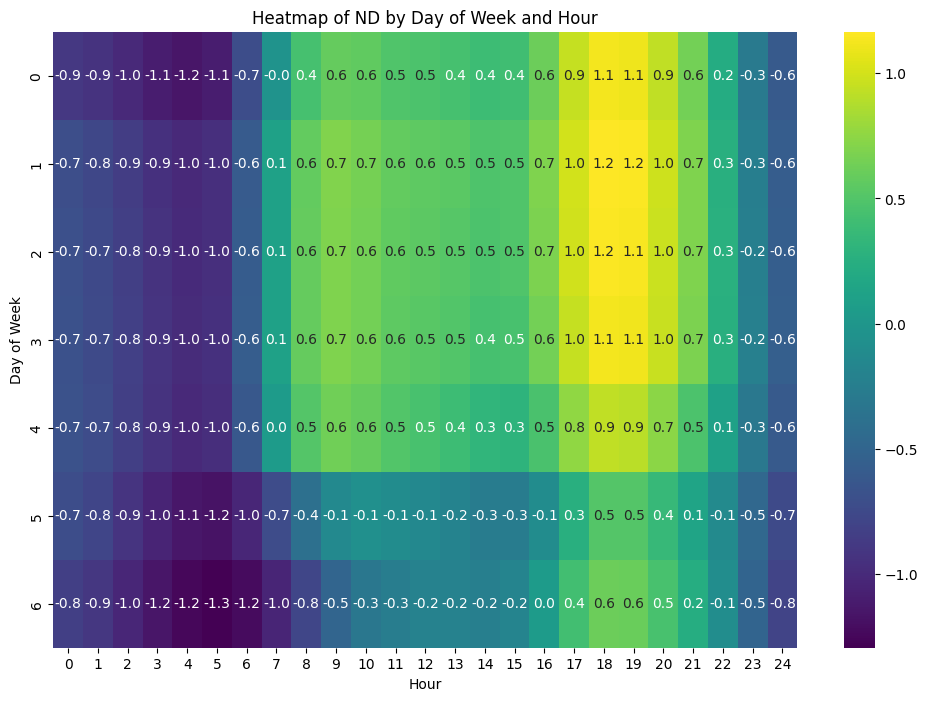

In [25]:
# Add day of week and hour columns
df['day_of_week'] = df['settlement_date'].dt.dayofweek
df['hour'] = df['settlement_period'] // 2  # Assuming 30-minute periods

# Pivot table for heatmap
heatmap_data = df.pivot_table(index='day_of_week', columns='hour', values='nd', aggfunc='mean')

plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='viridis', annot=True, fmt=".1f")
plt.title('Heatmap of ND by Day of Week and Hour')
plt.xlabel('Hour')
plt.ylabel('Day of Week')
plt.show()


<Figure size 1400x700 with 0 Axes>

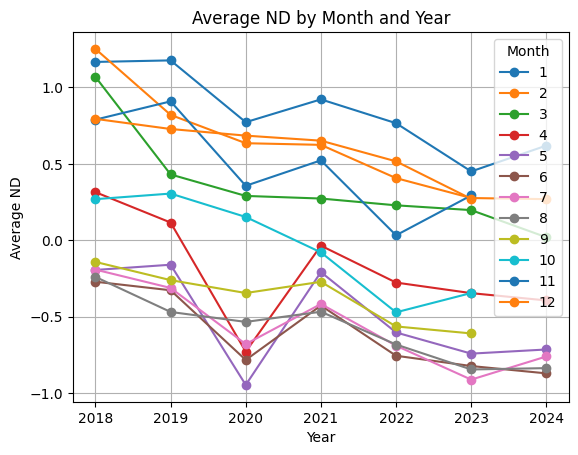

In [26]:
# Aggregating by month and year for ND
monthly_demand = df.groupby(['year', 'month'])['nd'].mean().unstack()

plt.figure(figsize=(14, 7))
monthly_demand.plot(kind='line', marker='o')
plt.title('Average ND by Month and Year')
plt.xlabel('Year')
plt.ylabel('Average ND')
plt.legend(title='Month')
plt.grid(True)
plt.show()


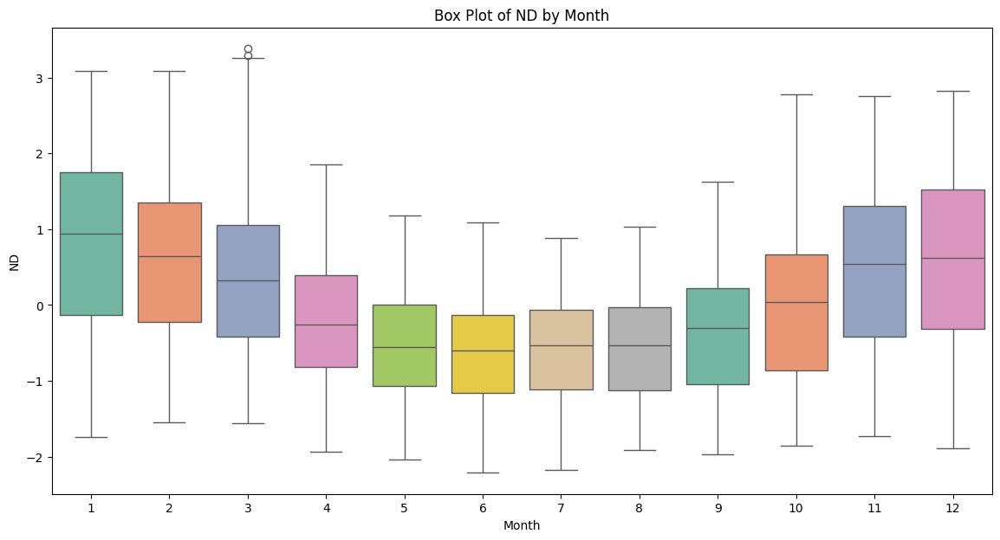

In [27]:
plt.figure(figsize=(14, 7))

sns.boxplot(x='month', y='nd', data=df, palette='Set2')
plt.title('Box Plot of ND by Month')
plt.xlabel('Month')
plt.ylabel('ND')
plt.show()


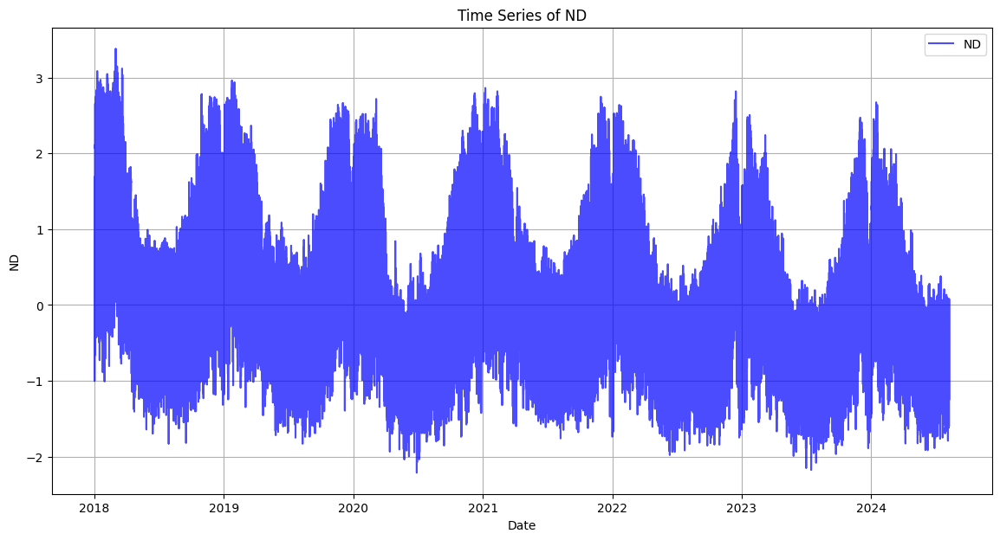

In [28]:
plt.figure(figsize=(14, 7))

plt.plot(df['settlement_date'], df['nd'], label='ND', color='blue', alpha=0.7)
plt.xlabel('Date')
plt.ylabel('ND')
plt.title('Time Series of ND')
plt.legend()
plt.grid(True)
plt.show()


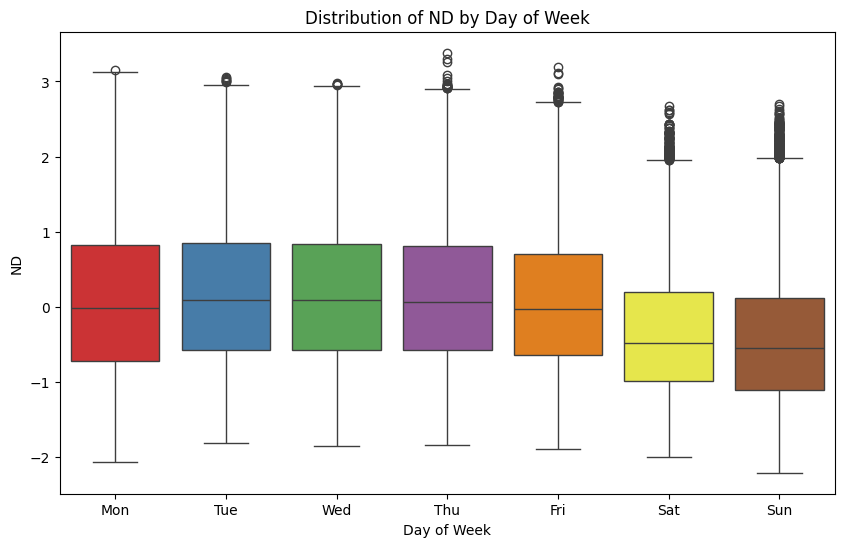

In [29]:
plt.figure(figsize=(10, 6))

sns.boxplot(x='day_of_week', y='nd', data=df, palette='Set1')
plt.title('Distribution of ND by Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('ND')
plt.xticks(ticks=range(7), labels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
plt.show()


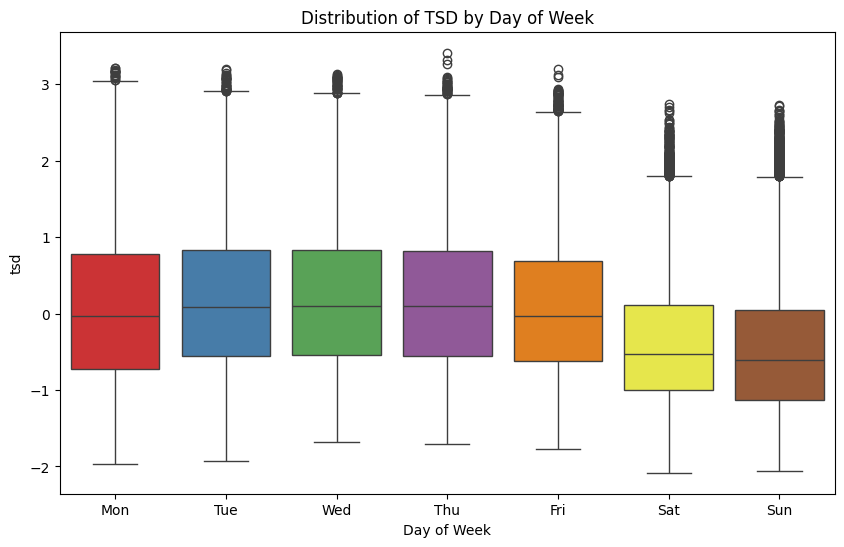

In [30]:
plt.figure(figsize=(10, 6))

sns.boxplot(x='day_of_week', y='tsd', data=df, palette='Set1')
plt.title('Distribution of TSD by Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('tsd')
plt.xticks(ticks=range(7), labels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
plt.show()


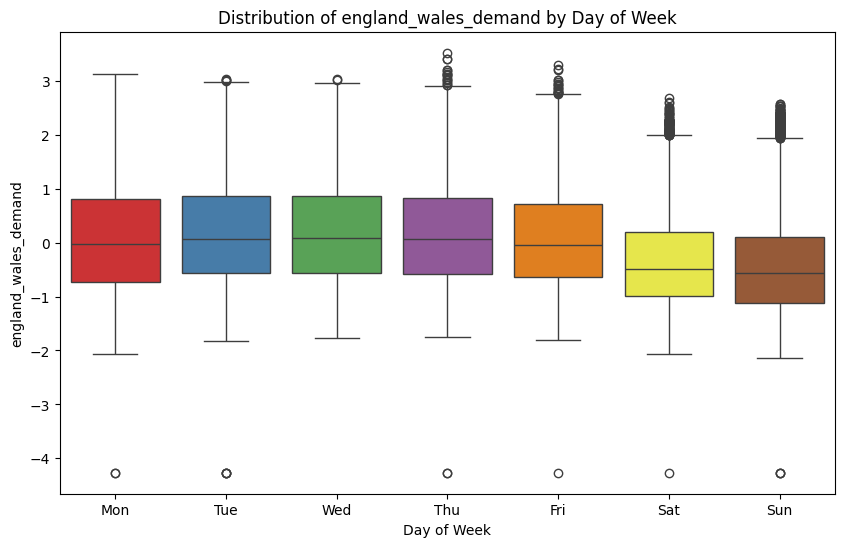

In [31]:
plt.figure(figsize=(10, 6))

sns.boxplot(x='day_of_week', y='england_wales_demand', data=df, palette='Set1')
plt.title('Distribution of england_wales_demand by Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('england_wales_demand')
plt.xticks(ticks=range(7), labels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
plt.show()


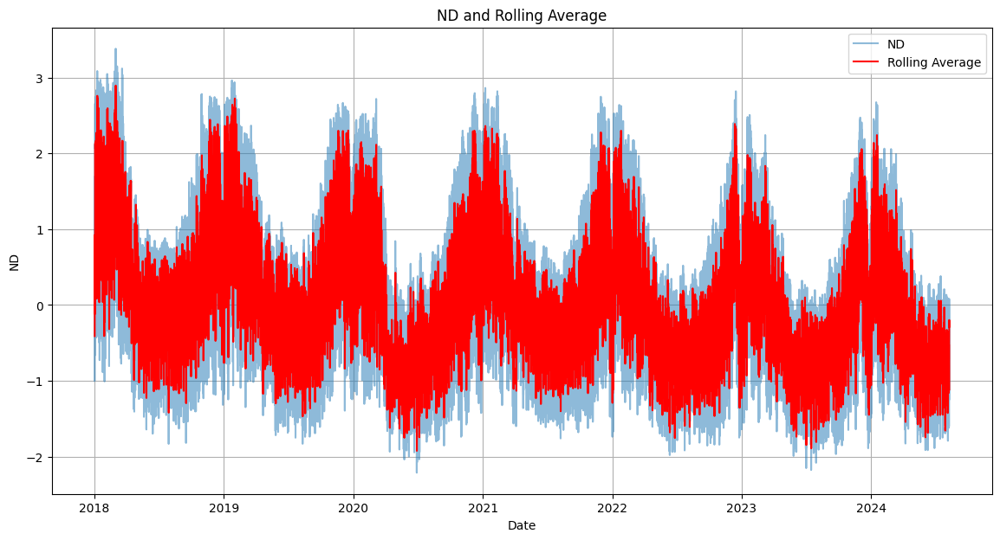

In [32]:
# Calculate rolling average
df['rolling_nd'] = df['nd'].rolling(window=24).mean()  # 24-hour rolling window

plt.figure(figsize=(14, 7))

plt.plot(df['settlement_date'], df['nd'], alpha=0.5, label='ND')
plt.plot(df['settlement_date'], df['rolling_nd'], color='red', label='Rolling Average')
plt.xlabel('Date')
plt.ylabel('ND')
plt.title('ND and Rolling Average')
plt.legend()
plt.grid(True)
plt.show()


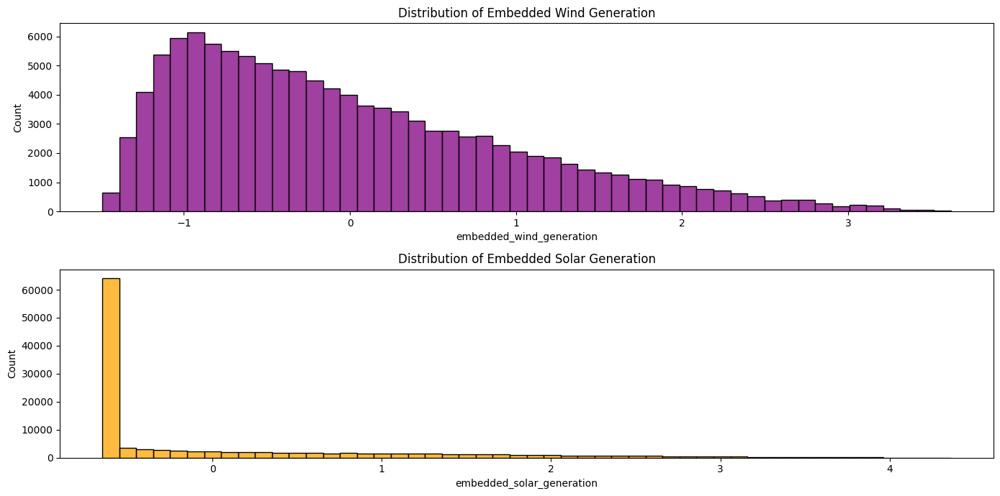

In [33]:
plt.figure(figsize=(14, 7))

plt.subplot(2, 1, 1)
sns.histplot(df['embedded_wind_generation'], bins=50, color='purple')
plt.title('Distribution of Embedded Wind Generation')

plt.subplot(2, 1, 2)
sns.histplot(df['embedded_solar_generation'], bins=50, color='orange')
plt.title('Distribution of Embedded Solar Generation')

plt.tight_layout()
plt.show()


In [34]:
from sklearn.model_selection import train_test_split



# Define features and targets
X = df.drop(columns=['nd', 'tsd', 'england_wales_demand', 'settlement_date'])
y_nd = df['nd']
y_tsd = df['tsd']
y_england_wales_demand = df['england_wales_demand']

# Split data
X_train, X_test, y_nd_train, y_nd_test = train_test_split(X, y_nd, test_size=0.2, random_state=42)
X_train, X_test, y_tsd_train, y_tsd_test = train_test_split(X, y_tsd, test_size=0.2, random_state=42)
X_train, X_test, y_england_wales_demand_train, y_england_wales_demand_test = train_test_split(X, y_england_wales_demand, test_size=0.2, random_state=42)


In [35]:
# Convert 'period_hour' to hours in numeric format
def convert_period_hour_to_hours(period):
    try:
        parts = period.split(':')
        return int(parts[0]) + int(parts[1])/60  # Convert to hours
    except:
        return np.nan  # Handle any conversion errors

X_train['period_hour_numeric'] = X_train['period_hour'].apply(convert_period_hour_to_hours)
X_test['period_hour_numeric'] = X_test['period_hour'].apply(convert_period_hour_to_hours)

# Drop the original 'period_hour' column as it's no longer needed
X_train = X_train.drop(columns=['period_hour'])
X_test = X_test.drop(columns=['period_hour'])



In [36]:
# Check for missing values
print(X_train.isnull().sum())

# Handle missing values (e.g., imputation or removal)
X_train = X_train.fillna(X_train.median())
X_test = X_test.fillna(X_test.median())


settlement_period             0
embedded_wind_generation      0
embedded_wind_capacity        0
embedded_solar_generation     0
embedded_solar_capacity       0
non_bm_stor                   0
pump_storage_pumping          0
ifa_flow                      0
ifa2_flow                     0
britned_flow                  0
moyle_flow                    0
east_west_flow                0
nemo_flow                     0
is_holiday                    0
month                         0
year                          0
day_of_week                   0
hour                          0
rolling_nd                   21
period_hour_numeric           0
dtype: int64


In [37]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


In [39]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

# Initialize and train the Random Forest Regressors
rf_nd = RandomForestRegressor(n_estimators=100, random_state=42)
rf_nd.fit(X_train_scaled, y_nd_train)

rf_tsd = RandomForestRegressor(n_estimators=100, random_state=42)
rf_tsd.fit(X_train_scaled, y_tsd_train)

rf_england_wales = RandomForestRegressor(n_estimators=100, random_state=42)
rf_england_wales.fit(X_train_scaled, y_england_wales_demand_train)

# Predict on the test set
y_nd_pred = rf_nd.predict(X_test_scaled)
y_tsd_pred = rf_tsd.predict(X_test_scaled)
y_england_wales_pred = rf_england_wales.predict(X_test_scaled)

# Evaluate the model performance
print("ND Mean Squared Error:", mean_squared_error(y_nd_test, y_nd_pred))
print("TSD Mean Squared Error:", mean_squared_error(y_tsd_test, y_tsd_pred))
print("England Wales Demand Mean Squared Error:", mean_squared_error(y_england_wales_demand_test, y_england_wales_pred))


ND Mean Squared Error: 0.011299356133327896
TSD Mean Squared Error: 0.014579859563219326
England Wales Demand Mean Squared Error: 0.015459258143519103


In [42]:
from sklearn.metrics import r2_score, mean_absolute_percentage_error, median_absolute_error

In [43]:
print("Random Forest Regressor for ND")
print(f"R2: {r2_score(y_nd_test, y_nd_pred)}")
print(f"MAPE: {mean_absolute_percentage_error(y_nd_test, y_nd_pred)}")
print(f"MedAE: {median_absolute_error(y_nd_test, y_nd_pred)}")

Random Forest Regressor for ND
R2: 0.9887194058899402
MAPE: 0.5738637563723086
MedAE: 0.059228744312479764


In [44]:
print("Random Forest Regressor for TSD")
print(f"R2: {r2_score(y_tsd_test, y_tsd_pred)}")
print(f"MAPE: {mean_absolute_percentage_error(y_tsd_test, y_tsd_pred)}")
print(f"MedAE: {median_absolute_error(y_tsd_test, y_tsd_pred)}")

Random Forest Regressor for TSD
R2: 0.9854315329174295
MAPE: 0.9268927272934157
MedAE: 0.06666840942976315


In [45]:
print("Random Forest Regressor for England-Wales Demand")
print(f"R2: {r2_score(y_england_wales_demand_test, y_england_wales_pred)}")
print(f"MAPE: {mean_absolute_percentage_error(y_england_wales_demand_test, y_england_wales_pred)}")
print(f"MedAE: {median_absolute_error(y_england_wales_demand_test, y_england_wales_pred)}")

Random Forest Regressor for England-Wales Demand
R2: 0.9845502609845345
MAPE: 0.7395791762906696
MedAE: 0.06298950397824754


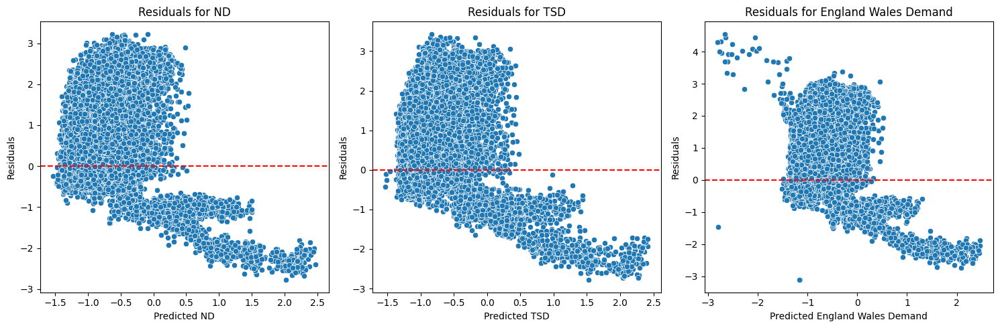

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns


# Make predictions
y_nd_pred = rf_nd.predict(X_test)
y_tsd_pred = rf_tsd.predict(X_test)
y_england_wales_pred = rf_england_wales.predict(X_test)

# Calculate residuals
residuals_nd = y_nd_test - y_nd_pred
residuals_tsd = y_tsd_test - y_tsd_pred
residuals_england_wales = y_england_wales_demand_test - y_england_wales_pred

# Plot residuals
plt.figure(figsize=(15, 5))

# Residual plot for ND
plt.subplot(1, 3, 1)
sns.scatterplot(x=y_nd_pred, y=residuals_nd)
plt.axhline(0, color='red', linestyle='--')
plt.title('Residuals for ND')
plt.xlabel('Predicted ND')
plt.ylabel('Residuals')

# Residual plot for TSD
plt.subplot(1, 3, 2)
sns.scatterplot(x=y_tsd_pred, y=residuals_tsd)
plt.axhline(0, color='red', linestyle='--')
plt.title('Residuals for TSD')
plt.xlabel('Predicted TSD')
plt.ylabel('Residuals')

# Residual plot for England Wales Demand
plt.subplot(1, 3, 3)
sns.scatterplot(x=y_england_wales_pred, y=residuals_england_wales)
plt.axhline(0, color='red', linestyle='--')
plt.title('Residuals for England Wales Demand')
plt.xlabel('Predicted England Wales Demand')
plt.ylabel('Residuals')

plt.tight_layout()
plt.show()


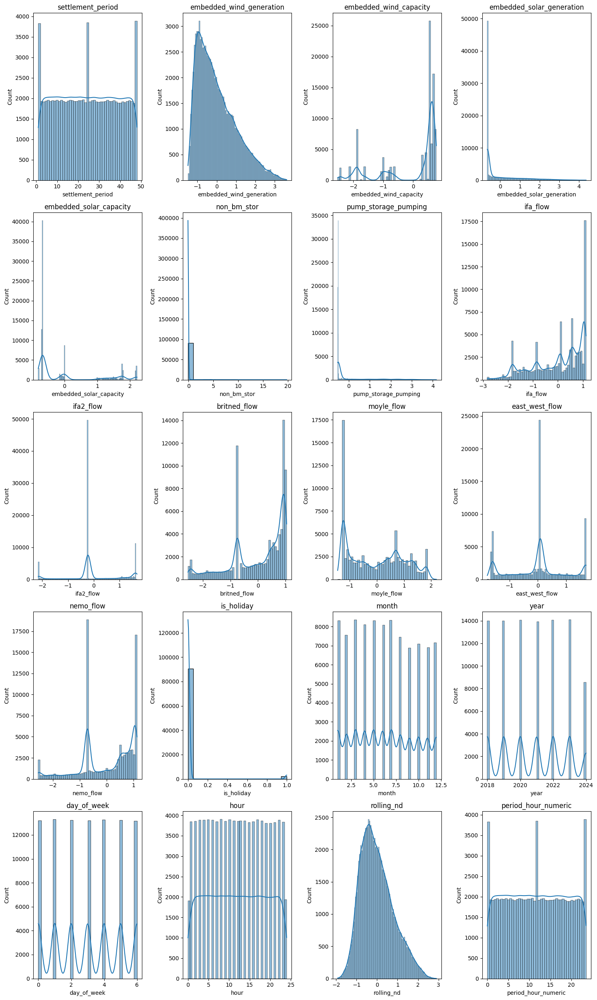

In [47]:
import matplotlib.pyplot as plt
import seaborn as sns

# Number of features
num_features = len(X_train.columns)

# Determine grid size
nrows = (num_features + 3) // 4  
ncols = min(num_features, 4)     

plt.figure(figsize=(15, 5 * nrows))

for i, feature in enumerate(X_train.columns, 1):
    plt.subplot(nrows, ncols, i)
    sns.histplot(X_train[feature], kde=True)
    plt.title(feature)

plt.tight_layout()
plt.show()



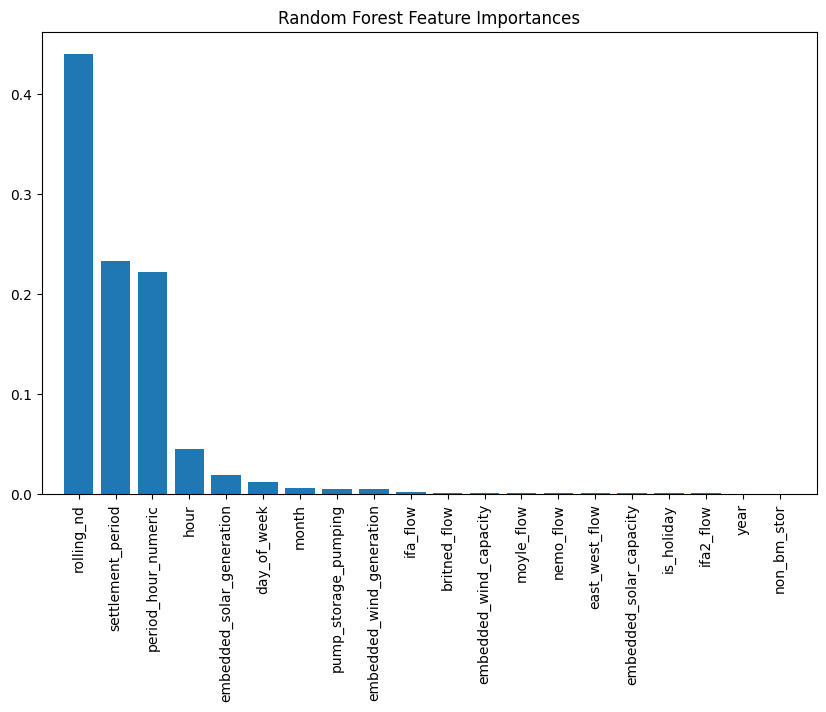

In [48]:
importances = rf_nd.feature_importances_
indices = np.argsort(importances)[::-1]

plt.figure(figsize=(10, 6))
plt.title('Random Forest Feature Importances')
plt.bar(range(X_train.shape[1]), importances[indices], align='center')
plt.xticks(range(X_train.shape[1]), X_train.columns[indices], rotation=90)
plt.xlim([-1, X_train.shape[1]])
plt.show()


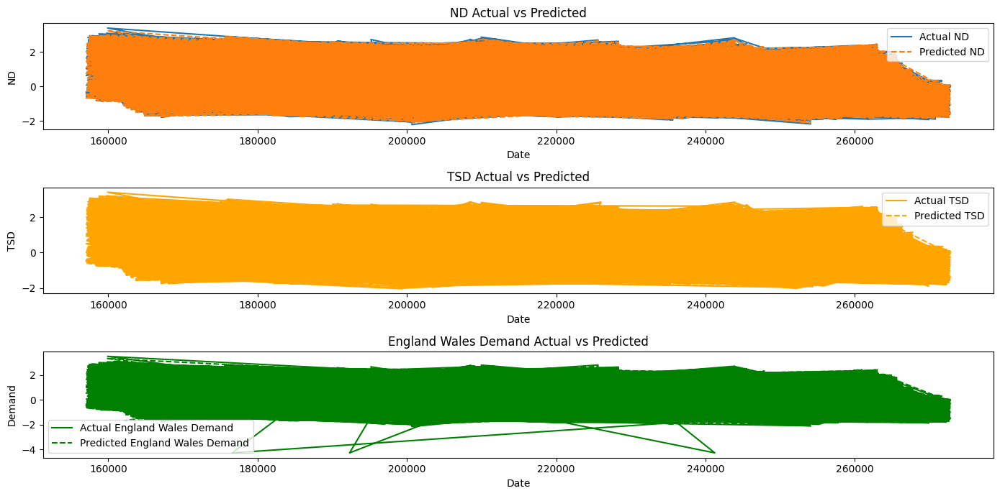

In [ ]:
# Random Forest Predictions
plt.figure(figsize=(14, 7))

plt.subplot(3, 1, 1)
plt.plot(y_nd_test.index, y_nd_test, label='Actual ND')
plt.plot(y_nd_test.index, y_nd_pred, label='Predicted ND', linestyle='--')
plt.title('ND Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('ND')
plt.legend()

plt.subplot(3, 1, 2)
plt.plot(y_tsd_test.index, y_tsd_test, label='Actual TSD', color='orange')
plt.plot(y_tsd_test.index, y_tsd_pred, label='Predicted TSD', linestyle='--', color='orange')
plt.title('TSD Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('TSD')
plt.legend()

plt.subplot(3, 1, 3)
plt.plot(y_england_wales_demand_test.index, y_england_wales_demand_test, label='Actual England Wales Demand', color='green')
plt.plot(y_england_wales_demand_test.index, y_england_wales_pred, label='Predicted England Wales Demand', linestyle='--', color='green')
plt.title('England Wales Demand Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Demand')
plt.legend()

plt.tight_layout()
plt.show()


In [49]:
from statsmodels.tsa.arima.model import ARIMA


df.set_index('settlement_date', inplace=True)

# Fit ARIMA models for each target variable
model_nd = ARIMA(df['nd'], order=(5,1,0))  # Adjust order as needed
model_nd_fit = model_nd.fit()

model_tsd = ARIMA(df['tsd'], order=(5,1,0))  # Adjust order as needed
model_tsd_fit = model_tsd.fit()

model_england_wales = ARIMA(df['england_wales_demand'], order=(5,1,0))  # Adjust order as needed
model_england_wales_fit = model_england_wales.fit()

# Forecast for 2025 (assuming monthly frequency for simplicity)
forecast_nd = model_nd_fit.get_forecast(steps=12).predicted_mean
forecast_tsd = model_tsd_fit.get_forecast(steps=12).predicted_mean
forecast_england_wales = model_england_wales_fit.get_forecast(steps=12).predicted_mean

print("Forecast for ND in 2025:", forecast_nd)
print("Forecast for TSD in 2025:", forecast_tsd)
print("Forecast for England Wales Demand in 2025:", forecast_england_wales)


Forecast for ND in 2025: 115762   -1.348156
115763   -1.390730
115764   -1.412973
115765   -1.396904
115766   -1.370531
115767   -1.329509
115768   -1.291015
115769   -1.252470
115770   -1.222361
115771   -1.198112
115772   -1.182886
115773   -1.173765
Name: predicted_mean, dtype: float64
Forecast for TSD in 2025: 115762   -1.093066
115763   -1.083152
115764   -1.056282
115765   -1.013645
115766   -0.971463
115767   -0.932803
115768   -0.901875
115769   -0.879196
115770   -0.864781
115771   -0.857223
115772   -0.854972
115773   -0.856315
Name: predicted_mean, dtype: float64
Forecast for England Wales Demand in 2025: 115762   -1.328496
115763   -1.393869
115764   -1.426732
115765   -1.430010
115766   -1.423169
115767   -1.403248
115768   -1.380905
115769   -1.358601
115770   -1.339527
115771   -1.324004
115772   -1.313169
115773   -1.306230
Name: predicted_mean, dtype: float64


In [51]:
# Print model summary
print(model_nd_fit.summary())


                               SARIMAX Results                                
Dep. Variable:                     nd   No. Observations:               115762
Model:                 ARIMA(5, 1, 0)   Log Likelihood              152838.261
Date:                Mon, 02 Sep 2024   AIC                        -305664.521
Time:                        15:09:50   BIC                        -305606.565
Sample:                             0   HQIC                       -305647.048
                             - 115762                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9944      0.003    386.455      0.000       0.989       0.999
ar.L2          0.1191      0.004     32.730      0.000       0.112       0.126
ar.L3         -0.3870      0.004   -109.392      0.0

In [52]:
# Print model summary
print(model_tsd_fit.summary())

                               SARIMAX Results                                
Dep. Variable:                    tsd   No. Observations:               115762
Model:                 ARIMA(5, 1, 0)   Log Likelihood              132479.428
Date:                Mon, 02 Sep 2024   AIC                        -264946.855
Time:                        15:10:13   BIC                        -264888.900
Sample:                             0   HQIC                       -264929.382
                             - 115762                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8911      0.002    508.509      0.000       0.888       0.895
ar.L2          0.0632      0.003     23.845      0.000       0.058       0.068
ar.L3         -0.1217      0.003    -35.266      0.0

In [53]:
print(model_england_wales_fit.summary())

                                SARIMAX Results                                 
Dep. Variable:     england_wales_demand   No. Observations:               115762
Model:                   ARIMA(5, 1, 0)   Log Likelihood               89540.181
Date:                  Mon, 02 Sep 2024   AIC                        -179068.362
Time:                          15:10:57   BIC                        -179010.406
Sample:                               0   HQIC                       -179050.889
                               - 115762                                         
Covariance Type:                    opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4789      0.000   1734.864      0.000       0.478       0.479
ar.L2          0.3377      0.000   1089.532      0.000       0.337       0.338
ar.L3          0.0394      0.000    

Forecast for ND until the end of 2026: 115762   -1.348156
115763   -1.390730
115764   -1.412973
115765   -1.396904
115766   -1.370531
115767   -1.329509
115768   -1.291015
115769   -1.252470
115770   -1.222361
115771   -1.198112
115772   -1.182886
115773   -1.173765
115774   -1.171105
115775   -1.172222
115776   -1.176511
115777   -1.181999
115778   -1.188095
115779   -1.193668
115780   -1.198486
115781   -1.202110
115782   -1.204635
115783   -1.206048
115784   -1.206606
115785   -1.206472
Name: predicted_mean, dtype: float64
Forecast for TSD until the end of 2026: 115762   -1.093066
115763   -1.083152
115764   -1.056282
115765   -1.013645
115766   -0.971463
115767   -0.932803
115768   -0.901875
115769   -0.879196
115770   -0.864781
115771   -0.857223
115772   -0.854972
115773   -0.856315
115774   -0.859771
115775   -0.864124
115776   -0.868509
115777   -0.872370
115778   -0.875425
115779   -0.877596
115780   -0.878942
115781   -0.879602
115782   -0.879748
115783   -0.879553
115784   -

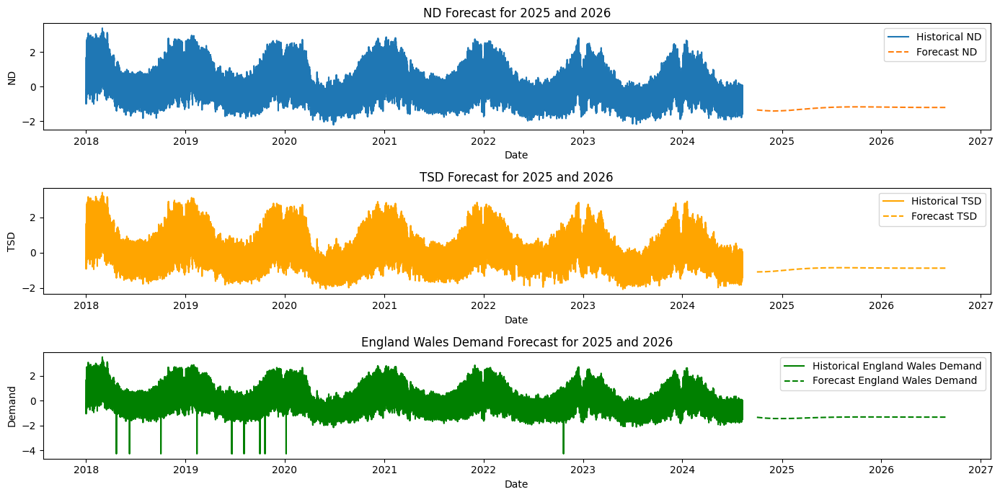

In [ ]:
# Forecast for the next 24 months (2025 and 2026)
forecast_steps = 24

# Generate forecasts
forecast_nd = model_nd_fit.get_forecast(steps=forecast_steps).predicted_mean
forecast_tsd = model_tsd_fit.get_forecast(steps=forecast_steps).predicted_mean
forecast_england_wales = model_england_wales_fit.get_forecast(steps=forecast_steps).predicted_mean

# Create a date range for the forecast period
forecast_dates = pd.date_range(start=df.index[-1] + pd.DateOffset(months=1), periods=forecast_steps, freq='M')

# Display forecast values
print("Forecast for ND until the end of 2026:", forecast_nd)
print("Forecast for TSD until the end of 2026:", forecast_tsd)
print("Forecast for England Wales Demand until the end of 2026:", forecast_england_wales)

# Plot the extended forecasts
plt.figure(figsize=(14, 7))

plt.subplot(3, 1, 1)
plt.plot(df.index, df['nd'], label='Historical ND')
plt.plot(forecast_dates, forecast_nd, label='Forecast ND', linestyle='--')
plt.title('ND Forecast for 2025 and 2026')
plt.xlabel('Date')
plt.ylabel('ND')
plt.legend()

plt.subplot(3, 1, 2)
plt.plot(df.index, df['tsd'], label='Historical TSD', color='orange')
plt.plot(forecast_dates, forecast_tsd, label='Forecast TSD', linestyle='--', color='orange')
plt.title('TSD Forecast for 2025 and 2026')
plt.xlabel('Date')
plt.ylabel('TSD')
plt.legend()

plt.subplot(3, 1, 3)
plt.plot(df.index, df['england_wales_demand'], label='Historical England Wales Demand', color='green')
plt.plot(forecast_dates, forecast_england_wales, label='Forecast England Wales Demand', linestyle='--', color='green')
plt.title('England Wales Demand Forecast for 2025 and 2026')
plt.xlabel('Date')
plt.ylabel('Demand')
plt.legend()

plt.tight_layout()
plt.show()
